# Video Search with Azure Computer Vision 4 (Florence)
## 3 Images embeddings

![image](logo.jpg)

In [1]:
import datetime
import glob
import json
import multiprocessing
import os
import plotly.express as px
import sys
import time

from azure import image_embedding_batch

from concurrent.futures import ThreadPoolExecutor
from dotenv import load_dotenv
from PIL import Image
from tqdm import tqdm
from umap import UMAP

In [2]:
load_dotenv("azure.env")

key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

## 1. Informations

In [3]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [4]:
print("Today is", datetime.datetime.today())

Today is 2023-09-25 13:25:17.968388


## 2. Frames

In [5]:
IMAGES_DIR = "frames"

In [6]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: frames
Total number of catalog images = 1,448


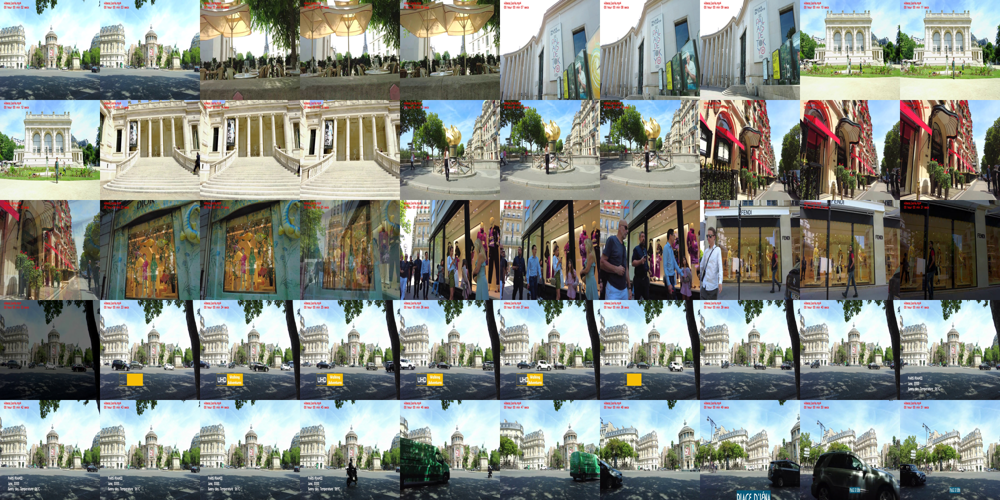

In [7]:
num_images_per_row = 10
num_images_per_col = 5
img_size = 200
start = 1

samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

# Load and resize the images
sample_images = [
    Image.open(image_file).resize((img_size, img_size)) for image_file in samples
]

# Paste the images onto the new image
for idx, img in enumerate(sample_images):
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 3. Vectors embedding generation for each frame

In [8]:
num_cores = multiprocessing.cpu_count()

print("Number of CPU cores =", num_cores)

Number of CPU cores = 16


In [9]:
def process_image(image_file, max_retries=20):
    """
    Process image with error management
    """
    num_retries = 0

    while num_retries < max_retries:
        try:
            embedding, response = image_embedding_batch(image_file)

            if response.status_code == 200:
                return embedding

            else:
                num_retries += 1
                print(
                    f"Error processing {image_file}: {response.status_code}.\
                Retrying... (attempt {num_retries} of {max_retries})"
                )

        except Exception as e:
            print(f"An error occurred while processing {image_file}: {e}")
            print(f"Retrying... (attempt {num_retries} of {max_retries})")
            num_retries += 1

    return None

In [10]:
def process_all_images(image_files, max_workers=4, max_retries=20):
    """
    Running the full process using pool
    """
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        embeddings = list(
            tqdm(
                executor.map(lambda x: process_image(x, max_retries), image_files),
                total=len(image_files),
            )
        )

    return [emb for emb in embeddings if emb is not None]

### Running the images vectors embeddings

In [11]:
print(
    datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"),
    "Starting to compute vector embeddings for our",
    "{:,}".format(len(image_files)),
    "catalog images...",
)
start = time.time()

# Running the images vector embeddings for all the images files
list_emb = process_all_images(image_files, max_workers=4, max_retries=20)

# End of job
print(datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"), "Done")
elapsed = time.time() - start
print(f"\nElapsed time: {int(elapsed / 60)} minutes, {int(elapsed % 60)} seconds")
print("Number of processed images =", len(list_emb))
print(f"Processing time per image = {(elapsed / len(list_emb)):.5f} sec")

25-Sep-2023 13:25:21 Starting to compute vector embeddings for our 1,448 catalog images...


100%|██████████| 1448/1448 [05:19<00:00,  4.53it/s]

25-Sep-2023 13:30:41 Done

Elapsed time: 5 minutes, 19 seconds
Number of processed images = 1448
Processing time per image = 0.22087 sec


In [12]:
print(f"Number of images files = {len(image_files)}")
print(f"Number of vectors embeddings = {len(list_emb)}")

Number of images files = 1448
Number of vectors embeddings = 1448


### Exporting the images vectors embeddings into a json file

In [13]:
JSON_DIR = "json"

os.makedirs(JSON_DIR, exist_ok=True)

In [14]:
print("Exporting images vector embeddings")

# Json filename
current_dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S"))
json_file = os.path.join(JSON_DIR, f"img_embed_{current_dt}.json")

# Saving vectors embeddings into this Json file
with open(json_file, "w") as f:
    json.dump(list_emb, f)

print("Done. Vector embeddings have been saved in:", json_file)

Exporting images vector embeddings
Done. Vector embeddings have been saved in: json/img_embed_25Sep2023_133041.json


### Exported file

In [15]:
# List of all Json files
json_list = [
    os.path.join(JSON_DIR, file)
    for file in os.listdir(JSON_DIR)
    if file.endswith(".json")
]

json_list

['json/img_embed_25Sep2023_133041.json']

### Importing the embeddings from a local file

In [16]:
print("Importing vectors embeddings...")

JSON_DIR = "json"

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_25Sep2023_133041.json

Done: number of imported vector embeddings = 1,448


## 4. Visualizing the images vectors embeddings

**Dimensionality reduction** is a valuable tool utilized by machine learning practitioners to gain insights and interpret large, complex datasets that have a high number of dimensions.

Among the visualization techniques available, t-SNE is popular, but it may be challenging to use and may perform poorly with larger datasets. Recently, McInnes et al. developed a new method called **UMAP, which offers several advantages over t-SNE, such as faster computation and better preservation of the data's global structure.**

In [17]:
print("Running Umap on the images vectors embeddings...")

start = time.time()
umap_2d = UMAP(n_components=2, init="random", random_state=0)
proj_2d = umap_2d.fit_transform(list_emb)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the images vectors embeddings...
Done
Elapsed time: 00:00:11.189328


In [18]:
fig_2d = px.scatter(
    proj_2d,
    x=0,
    y=1,
    color=image_files,
    title="Images Vectors Embeddings UMAP Projections",
    height=640,
    width=1024,
)

fig_2d.update_traces(marker_size=5, showlegend=False)
fig_2d.show()

In [19]:
print("Running Umap on the images vectors embeddings...")

start = time.time()
umap_3d = UMAP(n_components=3, init="random", random_state=0)
proj_3d = umap_3d.fit_transform(list_emb)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the images vectors embeddings...
Done
Elapsed time: 00:00:04.404246


In [20]:
fig_3d = px.scatter_3d(
    proj_3d,
    x=0,
    y=1,
    z=2,
    color=image_files,
    title="Images Vectors Embeddings UMAP Projections",
    height=640,
    width=1024,
)

fig_3d.update_traces(marker_size=3, showlegend=False)
fig_3d.show()

> In the next notebook we will do some search